In [1]:
import gym
import gym_pendrogone

import numpy as np
import matplotlib.pyplot as plt
# %matplotlib inline

# Imports specifically so we can render outputs in Jupyter.
from JSAnimation.IPython_display import display_animation
from matplotlib import animation
from IPython.display import display
from IPython.display import HTML

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
# %load_ext autoreload
# %autoreload 2

from utils import *

def display_frames_as_gif(frames):
    """
    Displays a list of frames as a gif, with controls
    """
    #plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames = len(frames), interval=25)
    anim = HTML(anim.to_html5_video())
    # display(display_animation(anim, default_mode='loop'))

In [ ]:
env = gym.make('Pendrogone-v1')

print(env.observation_space.shape)
print(env.action_space.shape)

action = 0.55 * 9.81 / 2

In [ ]:
a = (action, action)

frames = []
obs = env.reset()

for _ in range(1):
    obs, r, done, _ = env.step(a)
    # print(obs)
    frames.append(env.render(mode = 'rgb_array'))
display_frames_as_gif(frames)

# SAC

In [2]:
import gym_pendrogone   
from stable_baselines3 import PPO, a2c, SAC 
from stable_baselines3.common.env_util import make_vec_env
import gym

In [3]:
env = gym.make("Pendrogone-v1")

model = SAC.load("Pendrogone_sac.bak")

#now make the time series
max_time = 60
dt = env.dt # useful for the animation function
freq = 1/dt       # frequency/Hz
t = np.linspace(0, max_time, int(freq*max_time+1))
d2r = np.pi/180

/Users/kevinlee/anaconda3/lib/python3.7/site-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)
/Users/kevinlee/anaconda3/lib/python3.7/site-packages/stable_baselines3/common/save_util.py:169: UserWarning: Could not deserialize object lr_schedule. Consider using `custom_objects` argument to replace this object.
  + "this object."


In [107]:
def setObjective(env, objective):
    d = objective - env.env.state[0:2]
    if np.linalg.norm(d) <= 2:
        env.env.objective = objective
    else:
        unit_d = d / np.linalg.norm(d)
        env.env.objective = env.env.state[0:2] + 2 * unit_d

state_list, actions_list, rewards_list = [], [], []
final_objective = np.array([5,8])

obs = env.reset()
env.env.state = np.array([0, 0, 2*np.pi, np.pi-30*d2r, 0, 0, 0, 0])
setObjective(env, final_objective)
state_list.append(env.state)

for i in range(1, len(t)):
    action, _ = model.predict(obs)
    obs, rewards, dones, info = env.step(action)
    
    # Update objective
    setObjective(env, final_objective)
    
    # Add to lists
    state_list.append(env.state)
    actions_list.append(action)
    rewards_list.append(rewards)
    #env.render()
    
state_np = np.array(state_list)

In [48]:
animate_planar_quad_with_inverted_pendulum(t, state_np[:,0], state_np[:,1], state_np[:,2], state_np[:,3], display_in_notebook=True)

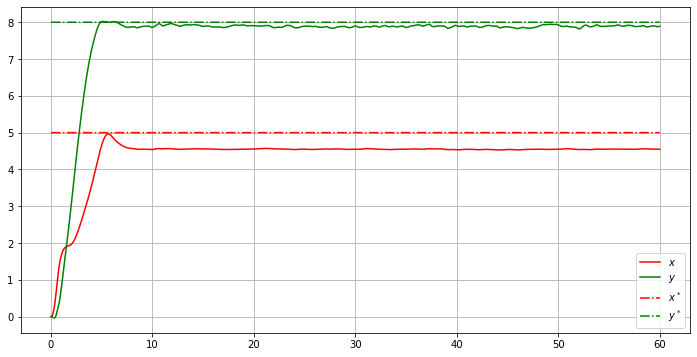

In [108]:
#Now plot the position vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,0],'r',label='$x$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,1],'g',label='$y$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,final_objective[0]*np.ones_like(t),'-.r',label='$x^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,final_objective[1]*np.ones_like(t),'-.g',label='$y^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

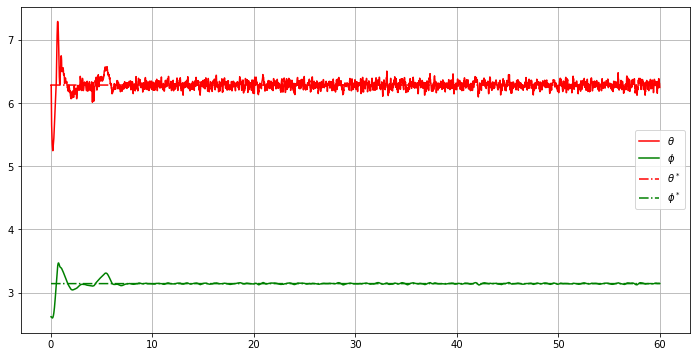

In [76]:
#Now plot the angle vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,2],'r',label='$\\theta$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,3],'g',label='$\\phi$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,2*np.pi*np.ones_like(t),'-.r',label='$\\theta^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,np.pi*np.ones_like(t),'-.g',label='$\\phi^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

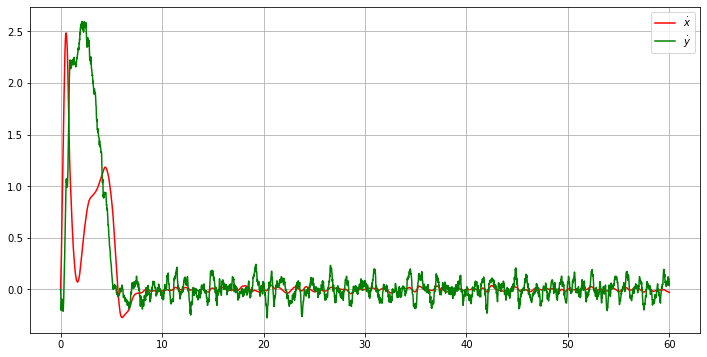

In [78]:
#Now plot the velocity vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,4],'r',label='$\\dot{x}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,5],'g',label='$\\dot{y}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

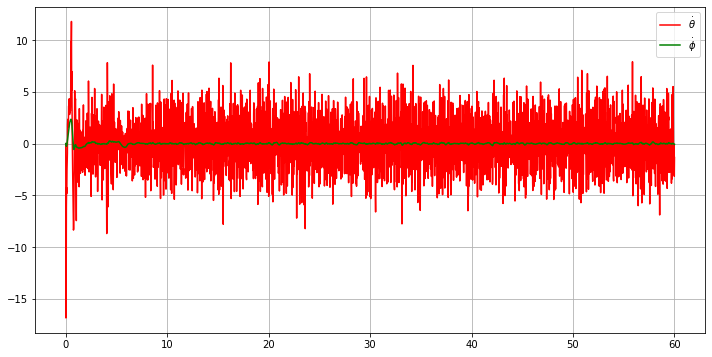

In [79]:
#Now plot the velocity vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,6],'r',label='$\\dot{\\theta}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,7],'g',label='$\\dot{\\phi}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

In [110]:
e = np.vstack((state_np[:,0] - final_objective[0],state_np[:,1] - final_objective[1]))
np.mean(np.linalg.norm(e,axis = 0))

0.8145237890006894

# Circle Trajectory

In [95]:
state_list, actions_list, rewards_list = [], [], []

w = 2*np.pi/30
x_des = 2*np.cos(w*t)
y_des = 2*np.sin(w*t)

obs = env.reset()
env.env.state = np.array([0, 0, 2*np.pi, np.pi-30*d2r, 0, 0, 0, 0])
setObjective(env, final_objective)
state_list.append(env.state)

for i in range(1, len(t)):
    action, _ = model.predict(obs)
    obs, rewards, dones, info = env.step(action)
    
    # Update objective
    setObjective(env, np.array([x_des[i], y_des[i]]))
    
    # Add to lists
    state_list.append(env.state)
    actions_list.append(action)
    rewards_list.append(rewards)
    #env.render()
    
state_np = np.array(state_list)

In [51]:
animate_planar_quad_with_inverted_pendulum(t, state_np[:,0], state_np[:,1], state_np[:,2], state_np[:,3], display_in_notebook=True)

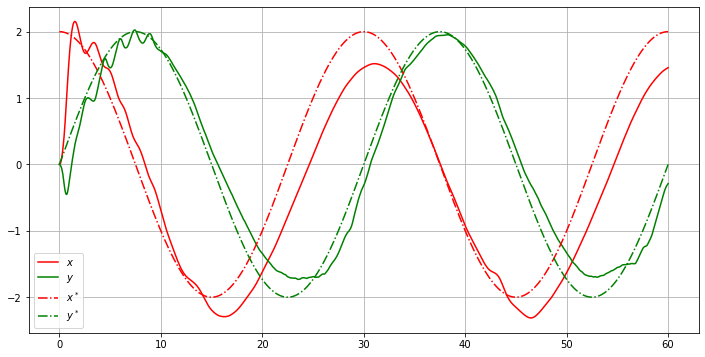

In [96]:
#Now plot the position vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,0],'r',label='$x$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,1],'g',label='$y$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,x_des,'-.r',label='$x^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,y_des,'-.g',label='$y^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

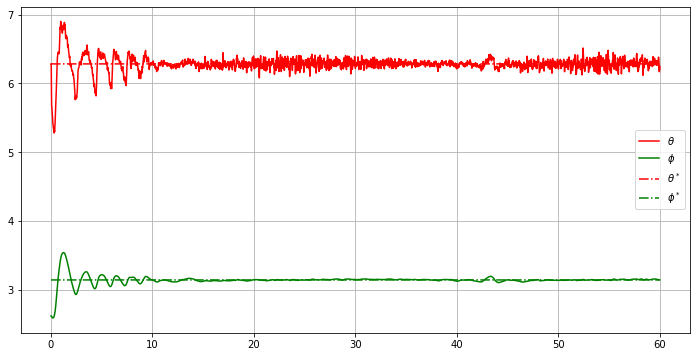

In [97]:
#Now plot the angle vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,2],'r',label='$\\theta$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,3],'g',label='$\\phi$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,2*np.pi*np.ones_like(t),'-.r',label='$\\theta^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,np.pi*np.ones_like(t),'-.g',label='$\\phi^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

In [99]:
e = np.vstack((state_np[:,0] - x_des,state_np[:,1] - y_des))
np.mean(np.linalg.norm(e,axis = 0))

0.51443906764648

# Noise Rejection

In [100]:
def noise():
    return np.random.multivariate_normal([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], np.diag([0,0,0,0,1e-3,1e-3,1e-3,1e-3]),1)

In [111]:
state_list, actions_list, rewards_list = [], [], []
final_objective = np.array([5,8])

obs = env.reset()
env.env.state = np.array([0, 0, 2*np.pi, np.pi-30*d2r, 0, 0, 0, 0])
setObjective(env, final_objective)
state_list.append(env.state)

for i in range(1, len(t)):
    action, _ = model.predict(obs)
    obs, rewards, dones, info = env.step(action)
    
    # Add noise
    env.env.state += noise()[0]
    obs = env.obs
    
    # Update objective
    setObjective(env, final_objective)
    
    # Add to lists
    state_list.append(env.state)
    actions_list.append(action)
    rewards_list.append(rewards)
    #env.render()
    
state_np = np.array(state_list)

In [87]:
animate_planar_quad_with_inverted_pendulum(t, state_np[:,0], state_np[:,1], state_np[:,2], state_np[:,3], display_in_notebook=True)

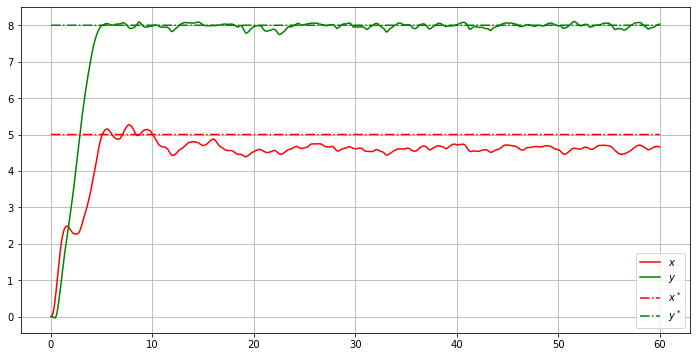

In [102]:
#Now plot the position vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,0],'r',label='$x$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,1],'g',label='$y$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,final_objective[0]*np.ones_like(t),'-.r',label='$x^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,final_objective[1]*np.ones_like(t),'-.g',label='$y^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

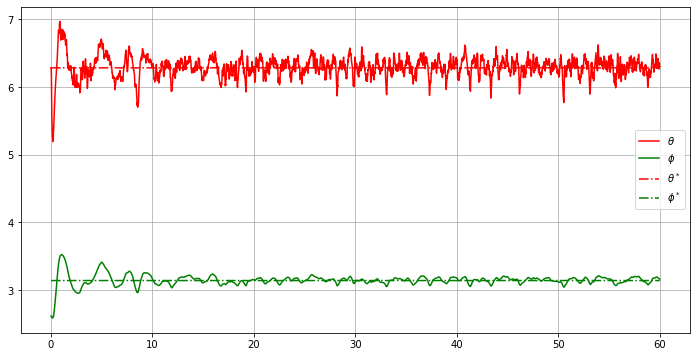

In [103]:
#Now plot the angle vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,2],'r',label='$\\theta$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,3],'g',label='$\\phi$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,2*np.pi*np.ones_like(t),'-.r',label='$\\theta^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,np.pi*np.ones_like(t),'-.g',label='$\\phi^*$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

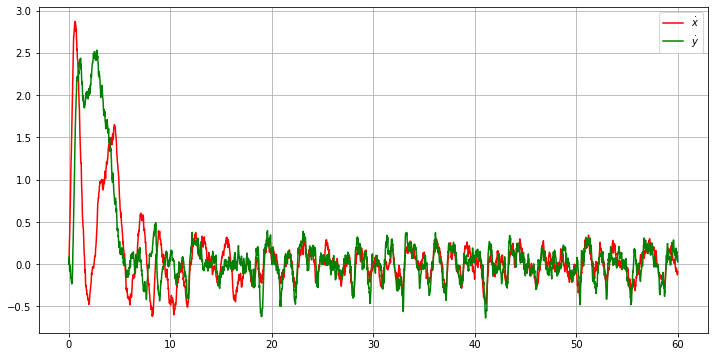

In [104]:
#Now plot the velocity vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,4],'r',label='$\\dot{x}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,5],'g',label='$\\dot{y}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

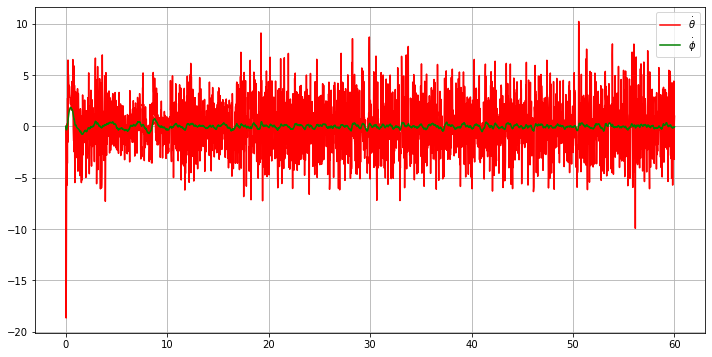

In [105]:
#Now plot the velocity vs time
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(111, autoscale_on=True) #if you want to strictly set the bounds
ax.grid() #this allows us to see the grid
ax.plot(t,state_np[:,6],'r',label='$\\dot{\\theta}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.plot(t,state_np[:,7],'g',label='$\\dot{\\phi}$') #Note: when using latex in legends, use double instead of single '\' for variables
ax.legend() #show the legend

plt.show() #this says display the info here

In [112]:
e = np.vstack((state_np[:,0] - final_objective[0],state_np[:,1] - final_objective[1]))
np.mean(np.linalg.norm(e,axis = 0))

0.7514721249161702